# Distracted Driver Detection

## Overview

The driver distracted detection project aimed to address the critical issue of distracted driving - A hazardous behavior that poses significant risks to personal and public safety. Deep Learning models were used to analyze dashboard camera images, distinguishing between safe driving practices and various forms of distraction, such as texting, talking on the phone, reaching to the backseat, or conversing with other passengers, etc. 

Various deep learning models, including self trained Convolutional Neural Networks (CNNs) architectures, Pre-Trained ResNet-50 and VGG-16 architectures were used in the project. Also different regularization approaches like Early Stopping, Dropout, Normalization were implemented and the metrics from the different models were compared to identify the best model that suits the usecase.

## Data Description

Given the significant impact of distracted driving on personal safety, public well-being, and financial considerations, insurance companies, such as State Farm, are actively seeking solutions to eliminate these risky behaviors. State Farm initiated a Kaggle competition to engage the community in the development of models capable of detecting distracted driving. The dataset provided by State Farm consisted of thousands of dashboard camera images capturing drivers engaged in both safe and distracted behaviors, such as texting or talking on the phone. For this project, we specifically focused on a subset of 22,424 images made available by State Farm. The image data was categorized into 10 distinct classes, labeled as c0 to c9, each representing a different driver behavior:

 - **c0**: Safe driving
 - **c1**: Texting - right hand
 - **c2**: Talking on the phone - right hand
 - **c3**: Texting - left hand
 - **c4**: Talking on the phone - left hand
 - **c5**: Operating the radio
 - **c6**: Drinking
 - **c7**: Reaching behind
 - **c8**: Hair and makeup
 - **c9**: Talking to passenger

The distribution of images across classes is as follows:

 - **c0**: 2489 images
 - **c1**: 2267 images
 - **c2**: 2317 images
 - **c3**: 2346 images
 - **c4**: 2326 images
 - **c5**: 2312 images
 - **c6**: 2325 images
 - **c7**: 2002 images
 - **c8**: 1911 images
 - **c9**: 2129 images
   
To streamline computational resources, the original RGB images with dimensions 480 x 640 were resized to 120 x 160. Additionally, a CSV file accompanied the images, providing essential information such as the image file name, subject (driver) ID, and the corresponding class ID. The primary objective of our project was to develop a robust model capable of accurately determining the specific behavior exhibited by the driver in each image, considering the 10 defined classes. The success of this model holds promise for enhancing road safety, preventing accidents, and contributing to the broader efforts of insurance companies to address distracted driving.



## Importing Libraries

In [29]:
# importing required libraries
import tensorflow as tf
import time
import pandas as pd
import numpy as np
import random
from collections import Counter
import matplotlib.pyplot as plt
from PIL import Image
import glob
import cv2 as cv
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, LSTM, RNN, Dropout, Flatten
from tensorflow.keras.models import Sequential
from keras.callbacks import EarlyStopping
from keras.layers import BatchNormalization
from keras.optimizers import Adam

## Reading Data

In [2]:
CLASS_DESCRIPTION = {
    'c0': 'safe driving',
    'c1': 'texting - right',
    'c2': 'talking on the phone - right',
    'c3': 'texting - left',
    'c4': 'talking on the phone - left',
    'c5': 'operating the radio',
    'c6': 'drinking',
    'c7': 'reaching behind',
    'c8': 'hair and makeup',
    'c9': 'talking to passenger'
}

In [3]:
# Images from the train folder will be used to train, validate and test the models
IMG_PATH = '../Data/train/'
img_list = []
img_labels = []
for file in glob.glob(IMG_PATH+'*/*.jpg'):
    label = file.split("/")[3]
    img_labels.append(label)
    img_array = cv.cvtColor(cv.imread(file), cv.COLOR_BGR2RGB)
    img_list.append(img_array)

## Data Exploration

In [27]:
# Checking Number of Images and Labels read
print(f"Number of Images Read: {len(img_list)}")
print(f"Number of Labels Read: {len(img_labels)}")

Number of Images Read: 22424
Number of Labels Read: 22424


We have 22424 images in total

In [28]:
dict(Counter(img_labels))

{'c7': 2002,
 'c0': 2489,
 'c9': 2129,
 'c8': 1911,
 'c1': 2267,
 'c6': 2325,
 'c3': 2346,
 'c4': 2326,
 'c5': 2312,
 'c2': 2317}

In [25]:
# Printing Number of Images per each class
img_dict = {}
for label in img_labels:
    if label in img_dict:
        img_dict[label]+=1
    else:
        img_dict[label]=1
labels = list(img_dict.keys())
labels.sort()
for label in labels:
    print(f"No of images in {label} : {img_dict[label]}")

No of images in c0 : 2489
No of images in c1 : 2267
No of images in c2 : 2317
No of images in c3 : 2346
No of images in c4 : 2326
No of images in c5 : 2312
No of images in c6 : 2325
No of images in c7 : 2002
No of images in c8 : 1911
No of images in c9 : 2129


In [31]:
# Checking random image shape from the image list
random.choice(img_list).shape

(480, 640, 3)

Each image in the img_list has a height of 480 pixels, a width of 640 pixels, and consists of three channels representing the Red, Green, and Blue components.

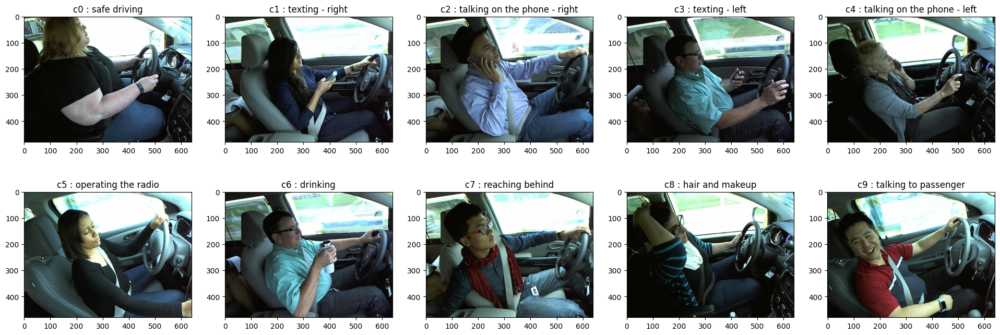

In [34]:
# Printing sample image for each class
rows = 2
cols = 5
fig, axes = plt.subplots(rows,cols, figsize=(24, 8))
for i in range(rows):
    for j in range(cols):
        axes[i][j].imshow(img_list[img_labels.index(labels[5*i+j])])
        axes[i][j].set_title(f"{labels[5*i+j]} : {CLASS_DESCRIPTION[labels[5*i+j]]}")
plt.show()

## Data Transformation

In [37]:
# Resizing images by 25 percent and also creating greyscale images
rgb_imgs_list = []
bw_img_list = []

for img in img_list:
    resized_img = cv.resize(img, (int(img.shape[1] * 0.25), int(img.shape[0] * 0.25)))
    bw_img = cv.cvtColor(resized_img, cv.COLOR_RGB2GRAY)
    bw_img_list.append(bw_img)
    rgb_imgs_list.append(resized_img)

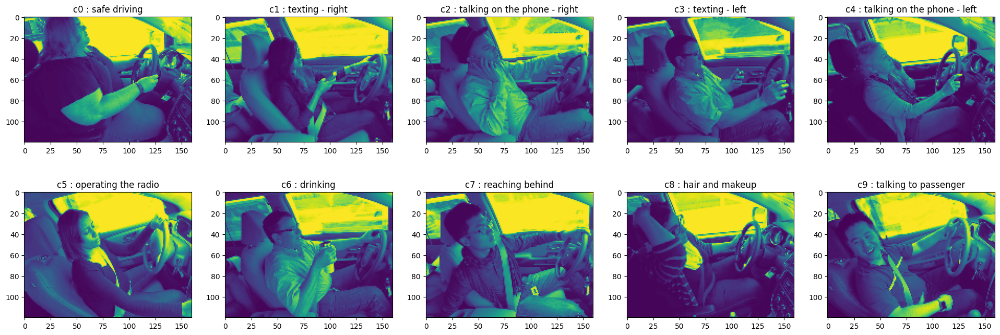

In [38]:
# Displaying greyscale images
rows = 2
cols = 5
fig, axes = plt.subplots(rows,cols, figsize=(24, 8))
for i in range(rows):
    for j in range(cols):
        axes[i][j].imshow(bw_img_list[img_labels.index(labels[5*i+j])])
        axes[i][j].set_title(f"{labels[5*i+j]} : {CLASS_DESCRIPTION[labels[5*i+j]]}")
plt.show()

A 2x5 grid of images are generated, each representing a specific driving behavior class. The black and white images are selected based on their labels, and each subplot is labeled with the corresponding class identifier and a brief description.

In [92]:
# Checking random image shape from the greyscale image list
print(f"Greyscale image shape: {random.choice(bw_img_list).shape}")
print(f"RGB image shape: {random.choice(rgb_imgs_list).shape}")

Greyscale image shape: (120, 160)
RGB image shape: (120, 160, 3)


After resizing the size of each image is shrinked to 120 x 160 pixels

The greyscale images consist of only single channel. Hence the image shape doesn't contain third value like RGB images

## Train Test Data Split

In [43]:
# Creating a label dataframe to split Train Test Data for labels
labels_df = pd.DataFrame(img_labels, columns=['label'])

# Resetting the index so that the index number will be used to fetch the associated image from the image list
labels_df = labels_df.reset_index()

# Encoding image labels to numericals for classification
labels_df["encoded_label"] = labels_df['label'].apply(lambda x: int(x[1]))

display(labels_df.head())
print(f"Labels Dataframe Shape: {labels_df.shape}")

,index,label,encoded_label
0,0,c7,7
1,1,c7,7
2,2,c7,7
3,3,c7,7
4,4,c7,7


Labels Dataframe Shape: (22424, 3)


In [44]:
labels_df['label'].value_counts()

label
c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: count, dtype: int64

In [45]:
# Splitting the data to create 20% of test data from the available data
train_val_df, test_df = train_test_split(labels_df, test_size=0.2, random_state = 1234)

# Splitting the train and validation data 
train_df, val_df = train_test_split(train_val_df, test_size=0.2, random_state = 1234)

In [46]:
print(train_df.shape)
print(val_df.shape)
print(test_df.shape)

(14351, 3)
(3588, 3)
(4485, 3)


To facilitate effective model training and evaluation, I partitioned the dataset into three distinct subsets: training, validation, and test sets. The dimensions of each subset are as follows:
- **Training Set (train_df)**: 14,351 samples
- **Validation Set (val_df)**: 3,588 samples
- **Test Set (test_df)**: 4,485 samples

The training set, comprising the majority of the data, is utilized to train the models. The validation set assists in tuning hyperparameters and monitoring the model's performance during training. The test set, kept separate from the training and validation phases, serves as an unbiased evaluation to assess the models' generalization capabilities on unseen data.



In [60]:
# Checking the number of images for each class across train, validation and test data
train_df_label_counts = pd.DataFrame(train_df['label'].value_counts()).reset_index()
train_df_label_counts.columns = ['label', 'train_data_label_counts']

val_df_label_counts = pd.DataFrame(val_df['label'].value_counts()).reset_index()
val_df_label_counts.columns = ['label', 'val_data_label_counts']

test_df_label_counts = pd.DataFrame(test_df['label'].value_counts()).reset_index()
test_df_label_counts.columns = ['label', 'test_data_label_counts']

label_counts_df = train_df_label_counts.merge(val_df_label_counts, on='label')
label_counts_df = label_counts_df.merge(test_df_label_counts, on='label')
label_counts_df.sort_values(by=['label'])

,label,train_data_label_counts,val_data_label_counts,test_data_label_counts
0,c0,1613,375,501
5,c1,1440,371,456
3,c2,1496,348,473
2,c3,1500,377,469
1,c4,1505,362,459
6,c5,1436,398,478
4,c6,1489,375,461
8,c7,1258,350,394
9,c8,1242,298,371
7,c9,1372,334,423


In [61]:
# Creating the train, validation and test data sets for the images and labels using the 
# Label Train, validation and Test split dataframes.

# Lists to hold greyscale Images
bw_train_img_list = []
bw_val_img_list = []
bw_test_img_list = []

# Lists to hold RGB Images
rgb_train_img_list = []
rgb_val_img_list = []
rgb_test_img_list = []


# Lists to hold the Labels
train_labels_list = []
val_labels_list =[]
test_labels_list = []


for row in train_df.iterrows():
    train_label = row[1]['encoded_label']
    train_index = row[1]['index']
    train_labels_list.append(train_label)
    bw_train_img_list.append(bw_img_list[train_index])
    rgb_train_img_list.append(rgb_imgs_list[train_index])

for row in val_df.iterrows():
    val_label = row[1]['encoded_label']
    val_index = row[1]['index']
    val_labels_list.append(val_label)
    bw_val_img_list.append(bw_img_list[val_index])
    rgb_val_img_list.append(rgb_imgs_list[val_index])
    
for row in test_df.iterrows():
    test_label = row[1]['encoded_label']
    test_index = row[1]['index']
    test_labels_list.append(test_label)
    bw_test_img_list.append(bw_img_list[test_index])
    rgb_test_img_list.append(rgb_imgs_list[test_index])



In [83]:
def print_sample_images(img_lst, label_lst, title):
    '''Displaying sample images for each class using given image list and label list'''
    rows = 2
    cols = 5
    fig, axes = plt.subplots(rows,cols, figsize=(24, 8))
    for i in range(rows):
        for j in range(cols):
            # Picking index for a class from the train labels list
            # But train labels has values like 0, 1, 2, ...
            # So using [1] to extract numerical value from the class label (c0, c1..)
            axes[i][j].imshow(img_lst[label_lst.index(int(labels[5*i+j][1]))])
            axes[i][j].set_title(f"{labels[5*i+j]} : {CLASS_DESCRIPTION[labels[5*i+j]]}")
    fig.suptitle(title)
    plt.show()

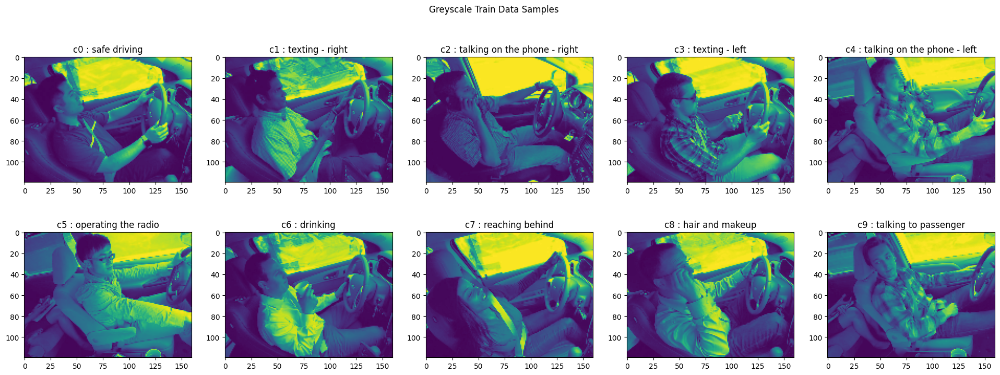

In [84]:
print_sample_images(bw_train_img_list, train_labels_list, "Greyscale Train Data Samples")

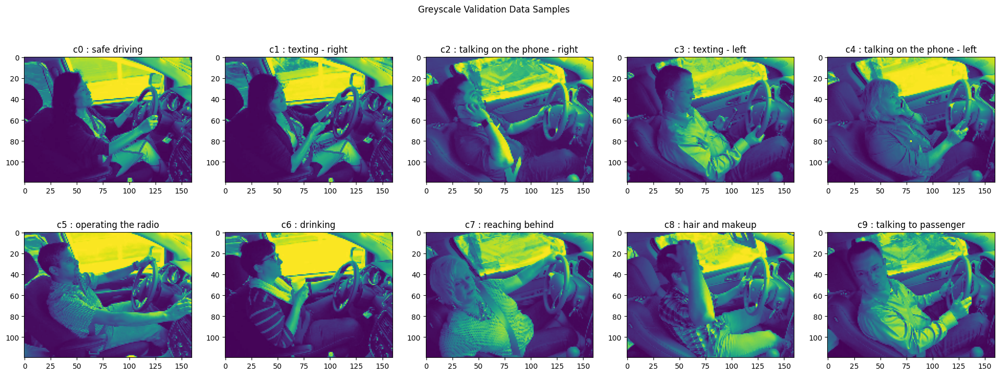

In [86]:
print_sample_images(bw_val_img_list, val_labels_list, "Greyscale Validation Data Samples")

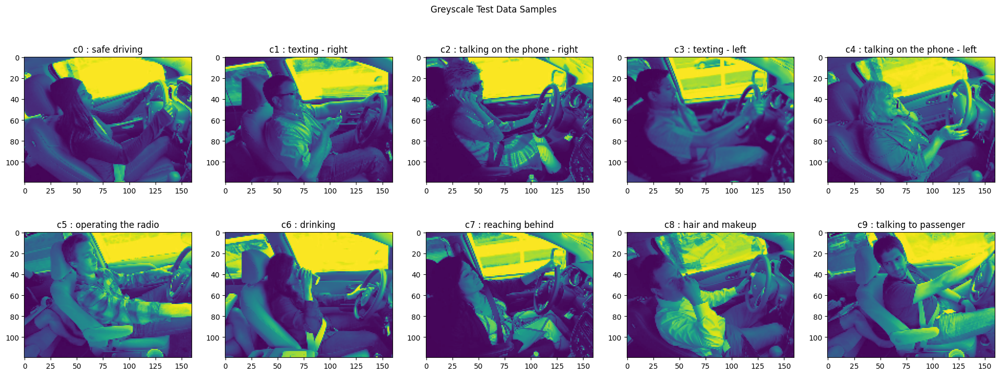

In [87]:
print_sample_images(bw_test_img_list, test_labels_list, "Greyscale Test Data Samples")

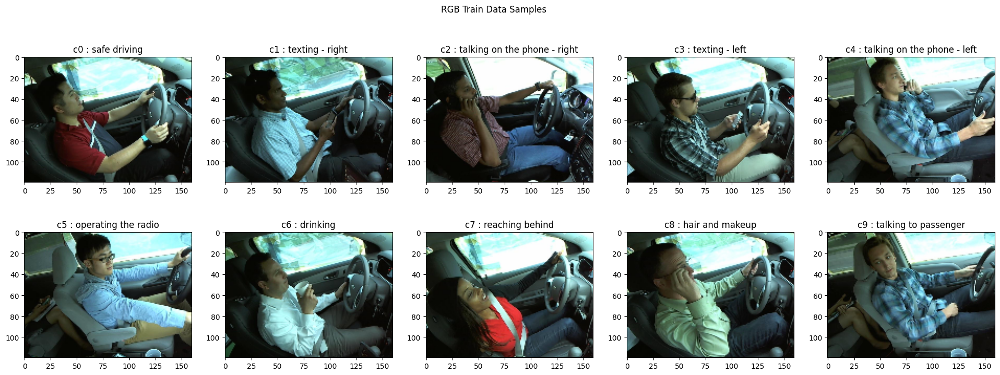

In [88]:
print_sample_images(rgb_train_img_list, train_labels_list, "RGB Train Data Samples")

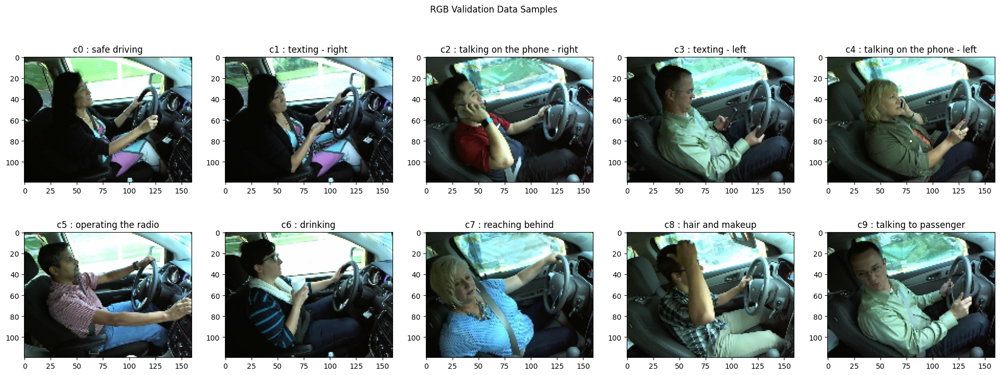

In [89]:
print_sample_images(rgb_val_img_list, val_labels_list, "RGB Validation Data Samples")

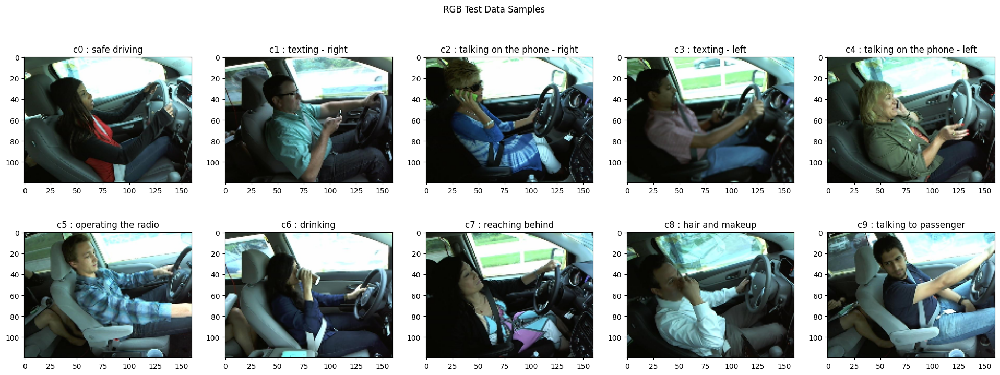

In [90]:
print_sample_images(rgb_test_img_list, test_labels_list, "RGB Test Data Samples")

## Modeling

In [123]:
model_stats_cols = [
    'model_name',
    'number_of_layers',
    'total_trainable_parameters',
    'training_accuracy',
    'validation_accuracy',
    'test_accuracy'
]
model_stats_df = pd.DataFrame(columns = model_stats_cols)

### Base Convolution Neural Network

#### Model Functions

In [94]:
# class Model():
#     def __init__(self, model, train_data, val_data, test_data, train_label, val_label, test_label, es=):
        

In [116]:
def time_it(func):
    def inner(*args, **kwargs):
        start_time = time.time()
        a = func(*args, **kwargs)
        end_time = time.time()
        print(f"Total time taken in {func.__name__}: {end_time - start_time} seconds")
        return a
    return inner

In [133]:
# Convolutional Neural Network (CNN) as base model for distracted driver detection, with the following architecture:
def get_base_cnn_model(name, image_type):
    if image_type.lower() == 'rgb':
        input_shape = (120, 160, 3)
    elif image_type == 'grey':
        input_shape = (120, 160, 1)
    else:
        raise Exception('Please enter either "rgb" or "grey" as parameter')
    np.random.seed(42)
    model = Sequential(name=name)
    model.add(Conv2D(128, (3, 3), activation='relu',
                       input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dense(10, activation='softmax'))
    return model

In [136]:
@time_it
def compile_fit_model(model, train_data, train_labels, val_data, 
                      val_labels, epochs, batch_size, 
                      loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'], callbacks=[]
                     ):
    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    history = model.fit(
        np.array(train_data)/255.0, np.array(train_labels),
         epochs=epochs, batch_size=batch_size,
        validation_data=(np.array(val_data)/255.0, np.array(val_labels))
    )
    return (model, history)

In [160]:
def plot_model_metrics(model_name, history):
    history_dict = history.history
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    for index, metric in enumerate(['loss', 'accuracy']):
        metric_values = history_dict[metric] 
        val_metric_values = history_dict[f'val_{metric}'] 
        epochs = range(1, len(metric_values) + 1)
        axes[index].plot(epochs, metric_values, 'bo', label=f'Training {metric.capitalize()}')
        axes[index].plot(epochs, val_metric_values, 'orange', label=f'Validation {metric.capitalize()}')
        axes[index].set_title(f'Training and validation {metric}')
        axes[index].set_xlabel('Epochs')
        axes[index].set_ylabel(metric.capitalize())
        axes[index].legend()
    fig.suptitle(f"Model {model_name} Metrics")
    plt.show()

#### Base Model Greyscale

In [139]:
base_model_greyscale = get_base_cnn_model('base_model_greyscale', 'grey')
base_model_greyscale.summary()

Model: "base_model_greyscale"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 118, 158, 128)     1280      
                                                                 
 max_pooling2d_21 (MaxPooli  (None, 59, 79, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_22 (Conv2D)          (None, 57, 77, 64)        73792     
                                                                 
 max_pooling2d_22 (MaxPooli  (None, 28, 38, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_23 (Conv2D)          (None, 26, 36, 32)        18464     
                                                                 
 max_pooling2d_23 (MaxPooli  (None, 13, 18, 32

In [140]:
(base_model_greyscale, base_model_greyscale_history) = compile_fit_model(
    base_model_greyscale, bw_train_img_list,
    train_labels_list, bw_val_img_list, 
    val_labels_list, 30, 100
)

Epoch 1/30
144/144 [==============================] - 26s 172ms/step - loss: 1.0504 - accuracy: 0.6410 - val_loss: 0.2241 - val_accuracy: 0.9373
Epoch 2/30
144/144 [==============================] - 23s 158ms/step - loss: 0.1533 - accuracy: 0.9579 - val_loss: 0.1413 - val_accuracy: 0.9601
Epoch 3/30
144/144 [==============================] - 22s 154ms/step - loss: 0.0838 - accuracy: 0.9765 - val_loss: 0.1330 - val_accuracy: 0.9677
Epoch 4/30
144/144 [==============================] - 22s 156ms/step - loss: 0.0456 - accuracy: 0.9864 - val_loss: 0.1130 - val_accuracy: 0.9766
Epoch 5/30
144/144 [==============================] - 23s 160ms/step - loss: 0.0516 - accuracy: 0.9839 - val_loss: 0.1613 - val_accuracy: 0.9691
Epoch 6/30
144/144 [==============================] - 24s 163ms/step - loss: 0.0626 - accuracy: 0.9838 - val_loss: 0.2191 - val_accuracy: 0.9635
Epoch 7/30
144/144 [==============================] - 23s 159ms/step - loss: 0.0718 - accuracy: 0.9818 - val_loss: 0.2101 - val_ac

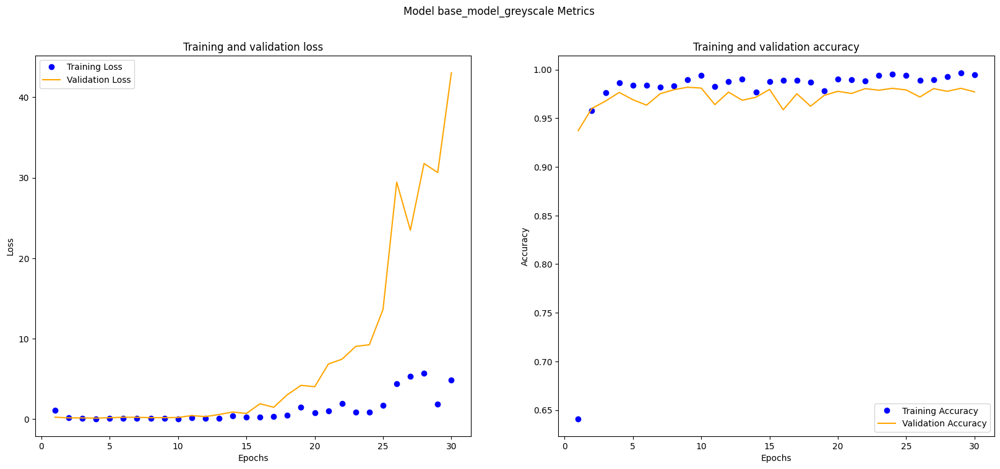

In [161]:
plot_model_metrics(base_model_greyscale.name, base_model_greyscale_history)

In [ ]:
# simple early stopping
#es = EarlyStopping(monitor='val_loss', mode='min', verbose=1)
#history = base_model.fit(np.array(rgb_train_img_list),np.array(train_labels_list),steps_per_epoch=100,
#                         validation_data=(np.array(rgb_val_img_list),np.array(val_labels_list)),epochs=30,batch_size=20, verbose=0, callbacks=[es])
# evaluate the model
#_, train_acc = base_model.evaluate(np.array(rgb_train_img_list), np.array(train_labels_list), verbose=0)
# _, test_acc = base_model.evaluate((np.array(rgb_val_img_list), np.array(val_labels_list)), verbose=0)
#print('Train: %.3f' % (train_acc))

In [ ]:
start_time = time.time()

history = base_model.fit(np.array(rgb_train_img_list)/255.0,np.array(train_labels_list),steps_per_epoch=100,
                         validation_data=(np.array(rgb_val_img_list)/255.0,np.array(val_labels_list)),epochs=30,batch_size=20)
end_time = time.time()
print(f"total time: {end_time - start_time} seconds")


##### The base CNN model was compiled using the Adam optimizer and sparse categorical cross-entropy loss function. The model has been trained on a subset of RGB images (normalized to the range [0, 1]) with associated labels for 30 epochs, using a batch size of 20 samples.

In [ ]:
base_model.save('../Results/CNN_Model_1.keras')

In [ ]:
history_dict = history.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) #acc wasn't defined before
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##### The training loss began at approximately 2.0262 and progressively increased throughout epochs, reaching 33.6439, while the validation loss, which started at around 1.1732, consistently rose and concluded at 81.5662. This suggests a potential issue with the model's ability to generalize well to new, unseen data during the training process.

In [ ]:
history_dict = history.history
accuracy_values = history_dict['accuracy'] # you can change this
val_accuracy_values = history_dict['val_accuracy'] # you can also change this
epochs = range(1, len(accuracy_values) + 1) #acc wasn't defined before
plt.plot(epochs, accuracy_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy_values, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

##### The Training Accuracy steadily rose, showing a consistent improvement. Similarly, the Validation Accuracy improved steadily, reflecting the model's ability to learn effectively across various datasets but there's a potential concern for overfitting since the loss trends diverged.

In [ ]:
np.random.seed(42)

base_model_1 = Sequential()
base_model_1.add(Conv2D(64, (3, 3), activation='relu',
                        input_shape=(120, 160, 3)))
base_model_1.add(BatchNormalization())
base_model_1.add(MaxPooling2D((2, 2)))
base_model_1.add(Conv2D(32, (3, 3), activation='relu'))
base_model_1.add(BatchNormalization())
base_model_1.add(MaxPooling2D((2, 2)))
base_model_1.add(Conv2D(24, (3, 3), activation='relu'))
base_model_1.add(BatchNormalization())
base_model_1.add(MaxPooling2D((2, 2)))
base_model_1.add(Flatten())
base_model_1.add(Dense(128, activation='relu'))
base_model_1.add(Dense(10, activation='softmax'))
base_model_1.summary()

optimizer = Adam(learning_rate=0.001)
base_model_1.compile(loss= 'sparse_categorical_crossentropy', optimizer= optimizer, metrics = ['accuracy'])   

start_time = time.time()

history1 = base_model_1.fit(np.array(rgb_train_img_list)/255.0,np.array(train_labels_list),steps_per_epoch=100,
                         validation_data=(np.array(rgb_val_img_list)/255.0,np.array(val_labels_list)),epochs=30,batch_size=20)

end_time = time.time()
print(f"total time: {end_time - start_time} seconds")

#####  An alternative convolutional neural network (CNN) model, referred to as base_model_1, designed to enhance the initial architecture. The model has been compiled using the Adam optimizer with a learning rate set to 0.001, aiming to enhance training efficiency. Additionally, batch normalization layers have been incorporated after each Conv2D layer to improve the model's stability and convergence during the training process. Subsequently, the model was trained on the RGB training images (normalized to [0, 1]) for 30 epochs, with a batch size of 20 samples. 

In [ ]:
base_model_1.save('../Results/CNN_Model_2.keras')

In [ ]:
history_dict = history1.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) #acc wasn't defined before
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##### The training loss consistently went down from the beginning to the end of training, reaching a stable value. Similarly, the validation loss showed a consistent decrease, indicating that the model learned well and performed effectively on new, unseen data during the validation process.

In [ ]:
history_dict = history.history
accuracy_values = history_dict['accuracy'] # you can change this
val_accuracy_values = history_dict['val_accuracy'] # you can also change this
epochs = range(1, len(accuracy_values) + 1) #acc wasn't defined before
plt.plot(epochs, accuracy_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy_values, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

##### The training accuracy steadily increased throughout the training process, showcasing effective learning. Additionally, the validation accuracy showed a consistent rise, staying in line with the training accuracy, with no divergence observed in the loss trends. This suggests that the model learned well and maintained its performance on both the training and validation datasets.

In [ ]:
tf.random.set_seed(42)

base_model_2 = Sequential()
base_model_2.add(Conv2D(64, (3, 3), activation='relu',
                        input_shape=(120, 160, 3)))
base_model_2.add(MaxPooling2D((2, 2)))
base_model_2.add(Conv2D(32, (3, 3), activation='relu'))
base_model_2.add(MaxPooling2D((2, 2)))
base_model_2.add(Flatten())
base_model_2.add(Dense(128, activation='relu'))
base_model_2.add(Dense(10, activation='softmax'))
base_model_2.summary()

base_model_2.compile(loss= 'sparse_categorical_crossentropy', optimizer= 'adam', metrics = ['accuracy'])   

start_time = time.time()
history2 = base_model_2.fit(np.array(rgb_train_img_list)/256,np.array(train_labels_list),steps_per_epoch=100,
                         validation_data=(np.array(rgb_val_img_list)/256,np.array(val_labels_list)),epochs=30,batch_size=20)

end_time = time.time()
print(f"total time: {end_time - start_time} seconds")

##### A modified version of the convolutional neural network (CNN) model, labeled as base_model_2 has been introduced, which differs from previous architectures by its adjusted layer composition. This variation is implemented to explore alternative configurations and assess their impact on the model's performance in the given task.

In [ ]:
base_model_2.save('../Results/CNN_Model_3.keras')

In [ ]:
history_dict = history2.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) #acc wasn't defined before
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##### The training loss strated at an initial value and consistently decreased throughout epochs, ultimately stabilizing at a final value. Similarly, the validation loss initiated at an initial value, displaying a continual decrease and converging to a final value. This consistent reduction in both training and validation losses indicates effective generalization, signifying the model's ability to learn and perform well on both seen and unseen data.

In [ ]:
history_dict = history2.history
accuracy_values = history_dict['accuracy'] # you can change this
val_accuracy_values = history_dict['val_accuracy'] # you can also change this
epochs = range(1, len(accuracy_values) + 1) #acc wasn't defined before
plt.plot(epochs, accuracy_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy_values, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

##### The training accuracy consistently and steadily increased, highlighting the model's effective learning during the training process. In parallel, the validation accuracy demonstrated a steady rise, maintaining alignment with the upward trend observed in the training accuracy. This suggests that the model not only learns well on the training data but also generalizes effectively to new, unseen data during the validation phase

In [ ]:
bw_base_model = Sequential()
bw_base_model.add(Conv2D(128, (3, 3), activation='relu',
                        input_shape=(120, 160, 1)))
bw_base_model.add(MaxPooling2D((2, 2)))
bw_base_model.add(Conv2D(64, (3, 3), activation='relu'))
bw_base_model.add(MaxPooling2D((2, 2)))
bw_base_model.add(Conv2D(32, (3, 3), activation='relu'))
bw_base_model.add(MaxPooling2D((2, 2)))
bw_base_model.add(Flatten())
bw_base_model.add(Dense(512, activation='relu'))
bw_base_model.add(Dense(10, activation='softmax'))
bw_base_model.summary()

bw_base_model.compile(loss= 'sparse_categorical_crossentropy', optimizer= 'adam', metrics = ['accuracy']) 

start_time = time.time()
history_bw = bw_base_model.fit(np.array(bw_train_img_list)/255.0,np.array(train_labels_list),steps_per_epoch=100,
                         validation_data=(np.array(bw_val_img_list)/255.0,np.array(val_labels_list)),epochs=30,batch_size=20)
end_time = time.time()
print(f"total time: {end_time - start_time} seconds")


##### The black and white (grayscale) variant of the convolutional neural network (CNN) model, denoted as bw_base_model has been developed. The model was compiled using the Adam optimizer and sparse categorical cross-entropy loss function. It was then trained on grayscale training images (normalized to [0, 1]) for 30 epochs, with a batch size of 20 samples. The total time taken for training the model was measured and recorded, summing up to a duration of 140.34 seconds.

In [ ]:
history_dict = history_bw.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) #acc wasn't defined before
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##### The training loss initiated at a certain value and steadily rose throughout epochs, reaching a final value of 4.0908. Simultaneously, the validation loss, started from an initial value, consistently increased and concluded with a final value of 11.8395. This suggests potential challenges in model learning and generalization on both training and validation datasets.

In [ ]:
history_dict = history_bw.history
accuracy_values = history_dict['accuracy'] # you can change this
val_accuracy_values = history_dict['val_accuracy'] # you can also change this
epochs = range(1, len(accuracy_values) + 1) #acc wasn't defined before
plt.plot(epochs, accuracy_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy_values, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

##### The training accuracy demonstrated a steady and continuous increase, indicating effective learning where as The validation accuracy exhibited a steady increase, aligning with the training accuracy.

In [ ]:
bw_base_model_1 = Sequential()
bw_base_model_1.add(Conv2D(64, (3, 3), activation='relu',
                        input_shape=(120, 160, 1)))
bw_base_model_1.add(BatchNormalization())
bw_base_model_1.add(MaxPooling2D((2, 2)))
bw_base_model_1.add(Conv2D(32, (3, 3), activation='relu'))
bw_base_model_1.add(BatchNormalization())
bw_base_model_1.add(MaxPooling2D((2, 2)))
bw_base_model_1.add(Conv2D(24, (3, 3), activation='relu'))
bw_base_model_1.add(BatchNormalization())
bw_base_model_1.add(MaxPooling2D((2, 2)))
bw_base_model_1.add(Flatten())
bw_base_model_1.add(Dense(128, activation='relu'))
bw_base_model_1.add(Dense(10, activation='softmax'))
bw_base_model_1.summary()

optimizer = Adam(learning_rate=0.001)
bw_base_model_1.compile(loss= 'sparse_categorical_crossentropy', optimizer= optimizer, metrics = ['accuracy'])   


start_time = time.time()
history_bw1 = bw_base_model_1.fit(np.array(bw_train_img_list)/255.0,np.array(train_labels_list),steps_per_epoch=100,
                         validation_data=(np.array(bw_val_img_list)/255.0,np.array(val_labels_list)),epochs=30,batch_size=20)
end_time = time.time()
print(f"total time: {end_time - start_time} seconds")



##### The modified grayscale variant of the convolutional neural network (CNN) model, denoted as bw_base_model_1 is implemented. The architecture is outlined as above. The model was compiled using the Adam optimizer with a learning rate of 0.001. Subsequently, it was trained on grayscale training images (normalized to [0, 1]) for 30 epochs, with a batch size of 20 samples. The total training time for the model was measured, amounting to total time: 101.35 seconds.

In [ ]:
history_dict = history_bw1.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) #acc wasn't defined before
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##### The training loss started at an initial value and consistently decreased over epochs, reaching a final value. While, the validation loss started at an initial value and consistently decreased, reaching a final value. This suggests effective generalization.

In [ ]:
history_dict = history_bw1.history
accuracy_values = history_dict['accuracy'] # you can change this
val_accuracy_values = history_dict['val_accuracy'] # you can also change this
epochs = range(1, len(accuracy_values) + 1) #acc wasn't defined before
plt.plot(epochs, accuracy_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy_values, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

##### The training accuracy demonstrated a steady and continuous increase, indicating effective learning and validation accuracy exhibited a steady increase, aligning with the training accuracy.


In [ ]:
bw_base_model_1.evaluate(np.array(bw_train_img_list)/255.0,np.array(train_labels_list))

In [ ]:
bw_base_model_1.evaluate(np.array(bw_test_img_list)/255.0,np.array(test_labels_list))

In [ ]:
bw_base_model_2 = Sequential()
bw_base_model_2.add(Conv2D(64, (3, 3), activation='relu',
                        input_shape=(120, 160, 1)))
bw_base_model_2.add(MaxPooling2D((2, 2)))
bw_base_model_2.add(Conv2D(32, (3, 3), activation='relu'))
bw_base_model_2.add(MaxPooling2D((2, 2)))
bw_base_model_2.add(Flatten())
bw_base_model_2.add(Dense(128, activation='relu'))
bw_base_model_2.add(Dense(10, activation='softmax'))
bw_base_model_2.summary()

bw_base_model_2.compile(loss= 'sparse_categorical_crossentropy', optimizer= 'adam', metrics = ['accuracy'])   

start_time = time.time()
history_bw2 = bw_base_model_2.fit(np.array(bw_train_img_list)/255.0,np.array(train_labels_list),steps_per_epoch=100,
                         validation_data=(np.array(bw_val_img_list)/255.0,np.array(val_labels_list)),epochs=30,batch_size=20)
end_time = time.time()
print(f"total time: {end_time - start_time} seconds")



##### A grayscale variant of the convolutional neural network (CNN) model has been designed, and labeled as bw_base_model_2. The model was compiled using the Adam optimizer and sparse categorical cross-entropy loss function. It was then trained on grayscale training images (normalized to [0, 1]) for 30 epochs, with a batch size of 20 samples.The total training time for the model was measured and recorded, amounting to total time: 78.286 seconds.

In [ ]:
history_dict = history_bw2.history
loss_values = history_dict['loss'] # you can change this
val_loss_values = history_dict['val_loss'] # you can also change this
epochs = range(1, len(loss_values) + 1) #acc wasn't defined before
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'orange', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##### The training loss started at an initial value and consistently decreased over epochs, reaching a final value, and the validation loss started at an initial value and consistently decreased, reaching a final value. This suggests effective generalization.

In [ ]:
history_dict = history_bw2.history
accuracy_values = history_dict['accuracy'] # you can change this
val_accuracy_values = history_dict['val_accuracy'] # you can also change this
epochs = range(1, len(accuracy_values) + 1) #acc wasn't defined before
plt.plot(epochs, accuracy_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy_values, 'orange', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

##### The training accuracy demonstrated a steady and continuous increase, indicating effective learning. Whereas, the validation accuracy exhibited a steady increase, aligning with the training accuracy indicates model performance. In contrast to RGB models, the BW models exhibit a reduction in processing time for the provided model configuration.